   Edited: Henry CH Yeung
   
   Author: Ankit Kariryaa, University of Bremen

### Getting started
Define the paths to the dataset and trained models in the `notebooks/config/UNetTraining.py` file.  

In [1]:
import tensorflow as tf
import numpy as np

get_ipython().run_line_magic('env', 'SM_FRAMEWORK=tf.keras')
import segmentation_models as sm
sm.set_framework('tf.keras')

from PIL import Image
import rasterio
import imgaug as ia
from imgaug import augmenters as iaa
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import imageio
import os
import time
import rasterio.warp             # Reproject raster samples
from functools import reduce
from tensorflow.keras.models import load_model

from core.UNet import UNet
from core.losses import tversky, focal_tversky
from core.optimizers import adaDelta, adagrad, adam, nadam
from core.frame_info import FrameInfo
from core.dataset_generator import DataGenerator
from core.split_frames import split_dataset
from core.visualize import display_images
from segmentation_models.losses import JaccardLoss, DiceLoss, CategoricalCELoss
from segmentation_models.metrics import IOUScore, FScore, Precision, Recall


import json
from sklearn.model_selection import train_test_split

get_ipython().run_line_magic('matplotlib', 'inline')
import matplotlib.pyplot as plt  # plotting tools
import matplotlib.patches as patches
from matplotlib.patches import Polygon

import warnings                  # ignore annoying warnings
warnings.filterwarnings("ignore")
import logging
logger = logging.getLogger()
logger.setLevel(logging.CRITICAL)

get_ipython().run_line_magic('reload_ext', 'autoreload')
get_ipython().run_line_magic('autoreload', '2')
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

print('Tensorflow version:', tf.__version__)
print('Num GPU available:', len(tf.config.list_physical_devices('GPU')))

env: SM_FRAMEWORK=tf.keras
Segmentation Models: using `tf.keras` framework.
Tensorflow version: 2.4.1
Num GPU available: 1


In [3]:
# Required configurations (including the input and output paths) are stored in a separate file (such as config/UNetTraining.py)
# Please provide required info in the file before continuing with this notebook. 
 
from config import FineTuning
# In case you are using a different folder name such as configLargeCluster, then you should import from the respective folder 
# Eg. from configLargeCluster import UNetTraining
config = FineTuning.Configuration()

import random

# Read all images/frames into memory
frames_train = []
frames_val = []

def build_frame_list(baseDir, subsample=False):
    frames = []
    
    all_files = os.listdir(baseDir)
    all_files_ndvi = [fn for fn in all_files if fn.startswith(config.ndvi_fn) and fn.endswith(config.image_type)]
#     all_files_ndvi = [fn for fn in all_files if fn.startswith(config.ndvi_fn) and fn.endswith(config.image_type)]
    
    if subsample:
        # Randomly select a fraction of files with a fixed seed
        random.seed(config.seed)
        selected_files = random.sample(all_files_ndvi, int(len(all_files_ndvi) * config.subsample_frac))
    else:
        selected_files = all_files_ndvi

    for i, fn in enumerate(selected_files):
        ndvi_img = rasterio.open(os.path.join(baseDir, fn))
        r_img = rasterio.open(os.path.join(baseDir, fn.replace(config.ndvi_fn,config.r_fn)))
        g_img = rasterio.open(os.path.join(baseDir, fn.replace(config.ndvi_fn,config.g_fn)))
        b_img = rasterio.open(os.path.join(baseDir, fn.replace(config.ndvi_fn,config.b_fn)))
        n_img = rasterio.open(os.path.join(baseDir, fn.replace(config.ndvi_fn,config.n_fn)))
#         print(fn)
        read_ndvi_img = ndvi_img.read()
        if not np.isnan(read_ndvi_img).all() and np.any(read_ndvi_img): # filter dataframe with NaN or all zeros
            read_r_img = r_img.read()
            read_g_img = g_img.read()
            read_b_img = b_img.read()
            read_n_img = n_img.read()
            comb_img = np.concatenate((read_ndvi_img, read_r_img, read_g_img, read_b_img, read_n_img), axis=0)
            comb_img = np.transpose(comb_img, axes=(1,2,0)) #Channel at the end
            annotation_im = rasterio.open(os.path.join(baseDir, fn.replace(config.ndvi_fn,config.annotation_fn)))
            annotation = annotation_im.read(1)
    #         if np.any(annotation): # remove all empty label dataframes
            weight_im = rasterio.open(os.path.join(baseDir, fn.replace(config.ndvi_fn,config.weight_fn)))
            weight = weight_im.read(1)
            f = FrameInfo(comb_img, annotation, weight)
            frames.append(f)
    return frames

frames_train_BASE = build_frame_list(config.base_dir_train_BASE, subsample=True)
frames_val_BASE = build_frame_list(config.base_dir_val_BASE, subsample=True)
frames_train_FT = build_frame_list(config.base_dir_train_FT, subsample=False)
frames_val_FT = build_frame_list(config.base_dir_val_FT, subsample=False)

frames_train = frames_train_BASE + frames_train_FT
frames_val = frames_val_BASE + frames_val_FT

# frames_random = frames_train + frames_val
print(f'Built {len(frames_train)} of training frames and {len(frames_val)} of validation frames')

Built 1548 of training frames and 266 of validation frames


In [5]:
# Required configurations (including the input and output paths) are stored in a separate file (such as config/UNetTraining.py)
# Please provide required info in the file before continuing with this notebook. 
 
from config import UNetTraining
# In case you are using a different folder name such as configLargeCluster, then you should import from the respective folder 
# Eg. from configLargeCluster import UNetTraining
config = UNetTraining.Configuration()

In [3]:
# # Read all images/frames into memory
# frames_train = []
# frames_val = []

# # Read all images/frames into memory
# frames_train = []
# frames_val = []

# def build_frame_list(baseDir):
#     frames = []
    
#     all_files = os.listdir(baseDir)
#     all_files_ndvi = [fn for fn in all_files if fn.startswith(config.ndvi_fn) and fn.endswith(config.image_type)]
# #     all_files_ndvi = [fn for fn in all_files if fn.startswith(config.ndvi_fn) and fn.endswith(config.image_type)]
    
#     for i, fn in enumerate(all_files_ndvi):
#         ndvi_img = rasterio.open(os.path.join(baseDir, fn))
#         r_img = rasterio.open(os.path.join(baseDir, fn.replace(config.ndvi_fn,config.r_fn)))
#         g_img = rasterio.open(os.path.join(baseDir, fn.replace(config.ndvi_fn,config.g_fn)))
#         b_img = rasterio.open(os.path.join(baseDir, fn.replace(config.ndvi_fn,config.b_fn)))
#         n_img = rasterio.open(os.path.join(baseDir, fn.replace(config.ndvi_fn,config.n_fn)))
# #         print(fn)
#         read_ndvi_img = ndvi_img.read()
#         if not np.isnan(read_ndvi_img).all() and np.any(read_ndvi_img): # filter dataframe with NaN or all zeros
#             read_r_img = r_img.read()
#             read_g_img = g_img.read()
#             read_b_img = b_img.read()
#             read_n_img = n_img.read()
#             comb_img = np.concatenate((read_ndvi_img, read_r_img, read_g_img, read_b_img, read_n_img), axis=0)
#             comb_img = np.transpose(comb_img, axes=(1,2,0)) #Channel at the end
#             annotation_im = rasterio.open(os.path.join(baseDir, fn.replace(config.ndvi_fn,config.annotation_fn)))
#             annotation = annotation_im.read(1)
#     #         if np.any(annotation): # remove all empty label dataframes
#             weight_im = rasterio.open(os.path.join(baseDir, fn.replace(config.ndvi_fn,config.weight_fn)))
#             weight = weight_im.read(1)
#             f = FrameInfo(comb_img, annotation, weight)
#             frames.append(f)
#     return frames

# frames_train = build_frame_list(config.base_dir_train)
# frames_val = build_frame_list(config.base_dir_val)
# # frames_random = frames_train + frames_val
# print(f'Built {len(frames_train)} of training frames and {len(frames_val)} of validation frames')

Built 1466 of training frames and 252 of validation frames


In [6]:
# training_frames, validation_frames, testing_frames  = split_dataset(frames_random, config.frames_json, config.patch_dir, test_size=config.test_ratio, val_size=config.val_ratio)
training_frames = list(range(len(frames_train)))
validation_frames = list(range(len(frames_val)))

annotation_channels = config.input_label_channel + config.input_weight_channel
train_generator = DataGenerator(config.input_image_channel, config.patch_size, training_frames, frames_train, annotation_channels, augmenter = 'iaa').random_generator(config.BATCH_SIZE, normalize=config.normalize, BACKBONE=config.PREPROCESS)
val_generator = DataGenerator(config.input_image_channel, config.patch_size, validation_frames, frames_val, annotation_channels, augmenter= None).random_generator(config.BATCH_SIZE, normalize=config.normalize, BACKBONE=config.PREPROCESS)
# test_generator = DataGenerator(config.input_image_channel, config.patch_size, testing_frames, frames_random, annotation_channels, augmenter= None).random_generator(config.BATCH_SIZE, normalize=config.normalize, BACKBONE=config.PREPROCESS)

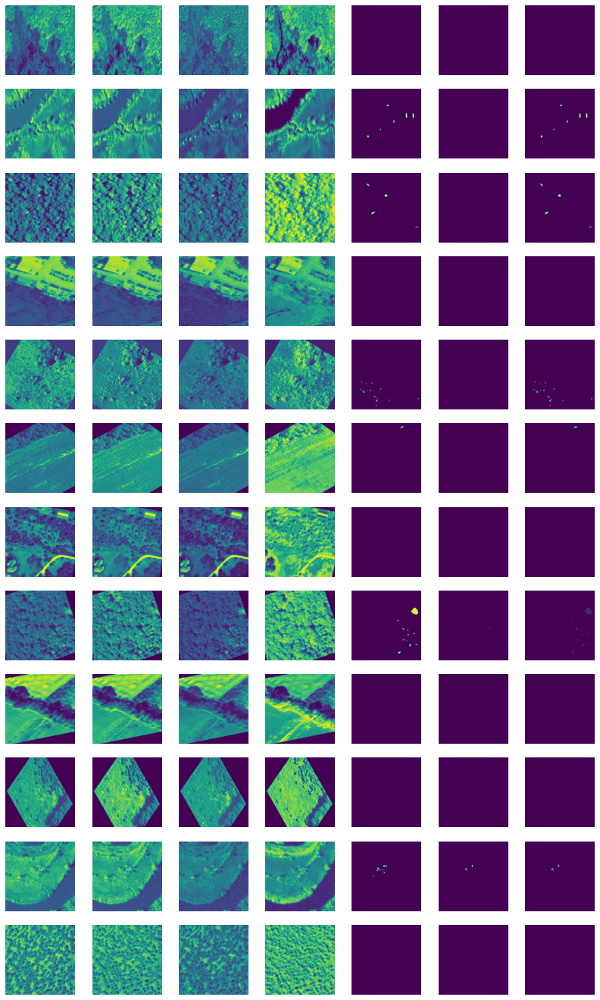

In [7]:
for _ in range(1):
    train_images, real_label = next(train_generator)
#     print(train_images.shape, real_label.shape)
    ann = real_label[:,:,:,0]
    wei = real_label[:,:,:,1]
    #overlay of annotation with boundary to check the accuracy
    #5 images in each row are: pan, ndvi, annotation, weight(boundary), overlay of annotation with weight
    overlay = ann + wei
    overlay = overlay[:,:,:,np.newaxis]
    display_images(np.concatenate((train_images[...,],real_label, overlay), axis = -1))
# print(np.max(train_images[...,[1]]))
# print(np.isnan(train_images).any())

In [8]:
# # Experimenting: Convert dataGenerator to tf.Data type for maximizing pipeline efficiency
# # https://medium.com/@acordier/tf-data-dataset-generators-with-parallelization-the-easy-way-b5c5f7d2a18
# AUTOTUNE = tf.data.AUTOTUNE
# def mapFunc(x, y):
#     return x, y
# train_generator_ds = tf.data.Dataset.from_generator(lambda: train_generator, output_types=(tf.float32, tf.float32))
# val_generator_ds = tf.data.Dataset.from_generator(lambda: val_generator, output_types=(tf.float32, tf.float32))

# def mapFunc2(x,y):
#     return tf.py_function(func=mapFunc, inp=[x,y], Tout=[tf.float32, tf.float32])
# train_generator_ds = train_generator_ds.map(mapFunc2, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)
# val_generator_ds = val_generator_ds.map(mapFunc2, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)

In [9]:
OPTIMIZER = adam
LOSS = focal_tversky

#Only for the name of the model in the very end
OPTIMIZER_NAME = 'Adam'
LOSS_NAME = 'weightmap_ftversky'+config.LOSS_config_name #alpha, beta, gamma
BACKBONE_NAME = str(config.BACKBONE)+'pt' if config.PRETRAIN else str(config.BACKBONE)

# Declare the path to the final model
# If you want to retrain an exising model then change the cell where model is declared. 
# This path is for storing a model after training.

timestr = time.strftime("%Y%m%d-%H%M")
chf = config.input_image_channel + config.input_label_channel
chs = reduce(lambda a,b: a+str(b), chf, '')


if not os.path.exists(config.model_path):
    os.makedirs(config.model_path)
model_path = os.path.join(config.model_path,'trees_{}_{}_{}_{}_{}_{}.h5'.format(BACKBONE_NAME,timestr,OPTIMIZER_NAME,LOSS_NAME,chs,config.input_shape[0]))

# The weights without the model architecture can also be saved. Just saving the weights is more efficent.

# weight_path="./saved_weights/UNet/{}/".format(timestr)
# if not os.path.exists(weight_path):
#     os.makedirs(weight_path)
# weight_path=weight_path + "{}_weights.best.hdf5".format('UNet_model')
# print(weight_path)

In [10]:
# # Define the model and compile it
# model = UNet([config.BATCH_SIZE, *config.input_shape],config.input_label_channel)

from segmentation_models import Unet
from segmentation_models.utils import set_regularization
from tensorflow.keras import regularizers
from tensorflow.keras.layers import Input, Conv2D
from tensorflow.keras.models import Model

# Define the model and compile it
base_model = Unet(config.BACKBONE, classes=1, activation='sigmoid', encoder_weights=config.PRETRAIN, encoder_freeze=False, decoder_use_batchnorm=True)
inp = Input(shape=config.input_shape)
l1 = Conv2D(3, (1, 1))(inp)
out = base_model(l1)
model = Model(inp, out, name=base_model.name)
model = set_regularization(model, kernel_regularizer=regularizers.l2(0.0001))
model.summary()

model.compile(optimizer=OPTIMIZER, loss=LOSS, metrics=[DiceLoss(class_indexes=0), JaccardLoss(class_indexes=0), FScore(class_indexes=0, threshold=0.5), IOUScore(class_indexes=0, threshold=0.5), Precision(class_indexes=0, threshold=0.5), Recall(class_indexes=0, threshold=0.5)])
print(f'Model is pretrained on {str(config.PRETRAIN)} with {str(config.BACKBONE)} encoder backbone')

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 256, 256, 4)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 256, 256, 3)       15        
_________________________________________________________________
model (Functional)           (None, None, None, 1)     37468673  
Total params: 37,468,688
Trainable params: 37,293,968
Non-trainable params: 174,720
_________________________________________________________________
Model is pretrained on imagenet with efficientnetb5 encoder backbone


In [11]:
# Define callbacks for the early stopping of training, LearningRateScheduler and model checkpointing
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau, TensorBoard


checkpoint = ModelCheckpoint(model_path, monitor='val_loss', verbose=1, 
                             save_best_only=True, mode='min', save_weights_only = False)

#reduceonplatea; It can be useful when using adam as optimizer
#Reduce learning rate when a metric has stopped improving (after some patience,reduce by a factor of 0.33, new_lr = lr * factor).
#cooldown: number of epochs to wait before resuming normal operation after lr has been reduced.
reduceLROnPlat = ReduceLROnPlateau(monitor='val_loss', factor=0.33,
                                   patience=100, verbose=1, mode='min',
                                   min_delta=0.0001, cooldown=4, min_lr=1e-7)

# LRScheduler; Reduce learning rate at specific epoch
def lr_schedule(epoch, learning_rate, n_steps=60, factor=0.33, min_lr=1e-8):
    # Reduce learning rate every n_steps epochs
    if (epoch + 1) % n_steps == 0 and learning_rate >= min_lr:  
        return learning_rate * factor  # Reduce learning rate by factor
    else:
        return learning_rate
LRScheduler = tf.keras.callbacks.LearningRateScheduler(lr_schedule, verbose=1)

early = EarlyStopping(monitor="val_loss", mode="min", verbose=2, patience=300)

log_dir = os.path.join('./logs','UNet_{}_{}_{}_{}_{}_{}'.format(BACKBONE_NAME,timestr,OPTIMIZER_NAME,LOSS_NAME,chs, config.input_shape[0]))
tensorboard = TensorBoard(log_dir=log_dir, histogram_freq=0, write_graph=True, write_grads=False, write_images=False, embeddings_freq=0, embeddings_layer_names=None, embeddings_metadata=None, embeddings_data=None, update_freq='epoch')

callbacks_list = [checkpoint, early, reduceLROnPlat, tensorboard] #reduceLROnPlat is not required with adaDelta

In [ ]:
def parallelize_input(generator, worker=10, max_queue=20):
    enq = tf.keras.utils.GeneratorEnqueuer(generator, use_multiprocessing=True)
    enq.start(workers=worker, max_queue_size=max_queue)
    return enq.get()
train_generator_mp = parallelize_input(train_generator, 10, 30)
val_generator_mp = parallelize_input(val_generator, 10, 30)

loss_history = [model.fit(train_generator_mp, 
                         steps_per_epoch=config.MAX_TRAIN_STEPS, 
                         epochs=config.NB_EPOCHS, 
                         validation_data=val_generator_mp,
                         validation_steps=config.VALID_IMG_COUNT,
                         callbacks=callbacks_list,
                         workers=1,
                         max_queue_size=20,
                         use_multiprocessing=False # the generator is not very thread safe
                        )]


Epoch 1/1000
 711/1000 [====================>.........] - ETA: 1:36 - loss: 0.9057 - dice_loss: 0.9154 - jaccard_loss: 0.9514 - f1-score: 0.1638 - iou_score: 0.1016 - precision: 0.1133 - recall: 0.8557

In [5]:
# # Load model after training
# # If you load a model with different python version, than you may run into a problem: https://github.com/keras-team/keras/issues/9595#issue-303471777
# OPTIMIZER = adam
# # InitialialLearningRate = 5.92960479480098e-06
# LOSS = focal_tversky 
# model_path = './saved_models/UNet_FINAL/trees_efficientnetb5pt_20231105-1716_Adam_weightmap_ftversky3708_12345_256.h5'
# model = load_model(model_path, custom_objects={'ftversky': LOSS, 'DiceLoss': DiceLoss(class_indexes=0), 'JaccardLoss': JaccardLoss(class_indexes=0), 'F1-Score': FScore(class_indexes=0, threshold=0.5), 'IOU-Score': IOUScore(class_indexes=0, threshold=0.5), 'Precision': Precision(class_indexes=0, threshold=0.5), 'Recall': Recall(class_indexes=0, threshold=0.5)}, compile=False)
# model.summary()
# # In case you want to use multiple GPU you can uncomment the following lines.
# # from tensorflow.python.keras.utils import multi_gpu_model
# # model = multi_gpu_model(model, gpus=8, cpu_merge=False)

# model.compile(optimizer=OPTIMIZER, loss=LOSS, metrics=[DiceLoss(class_indexes=0), JaccardLoss(class_indexes=0), FScore(class_indexes=0, threshold=0.5), IOUScore(class_indexes=0, threshold=0.5), Precision(class_indexes=0, threshold=0.5), Recall(class_indexes=0, threshold=0.5)])
# # tf.keras.backend.set_value(model.optimizer.learning_rate, InitialialLearningRate)
# print('Current Learning Rate:', OPTIMIZER._decayed_lr('float32').numpy())


Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 256, 256, 4)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 256, 256, 3)       15        
_________________________________________________________________
model (Functional)           (None, None, None, 1)     37468673  
Total params: 37,468,688
Trainable params: 37,293,968
Non-trainable params: 174,720
_________________________________________________________________
Current Learning Rate: 1e-04


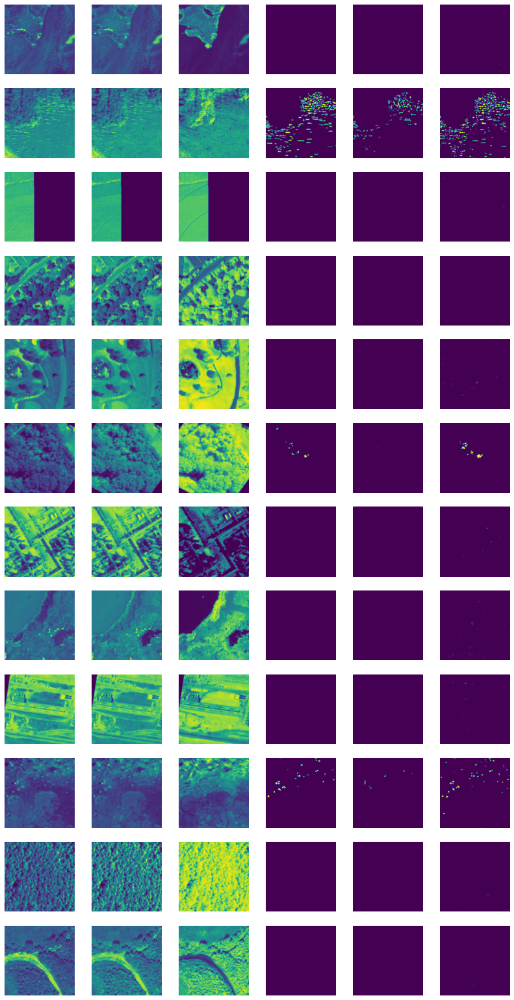

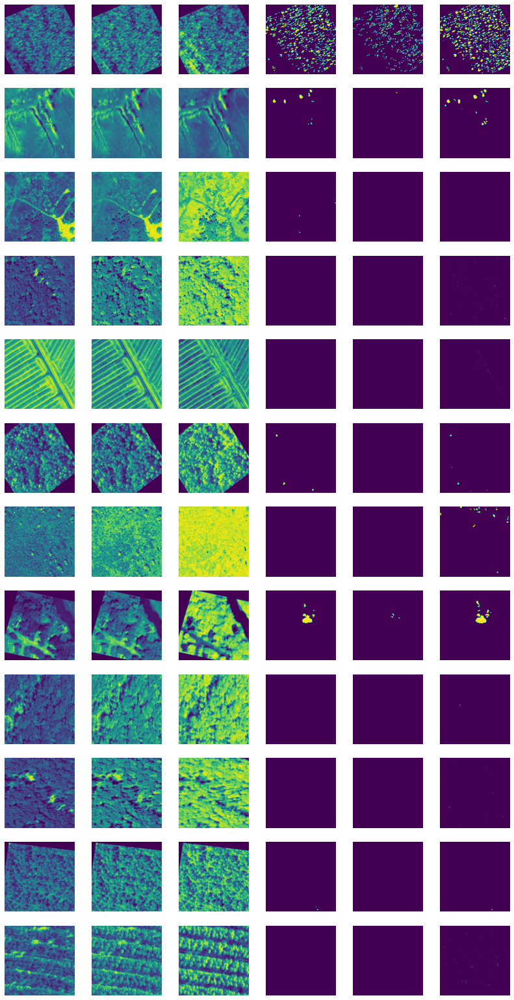

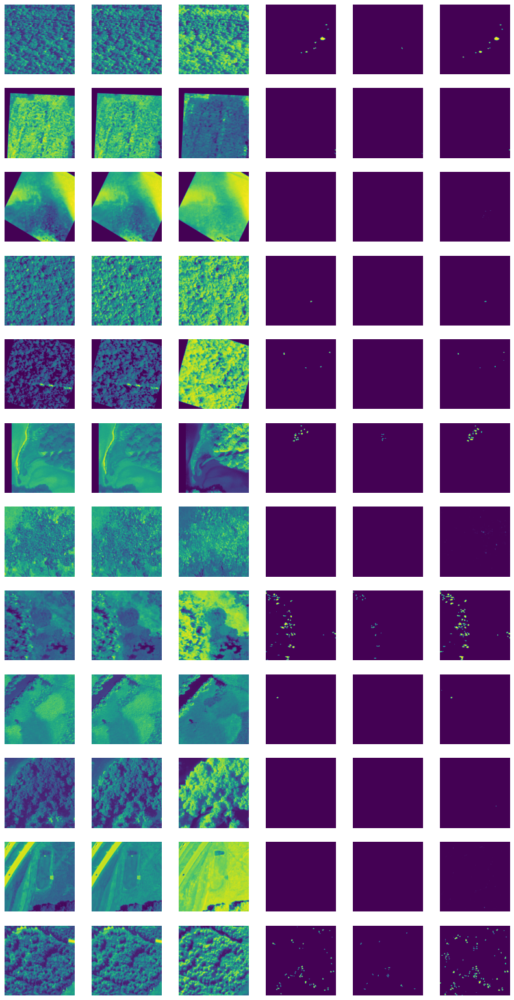

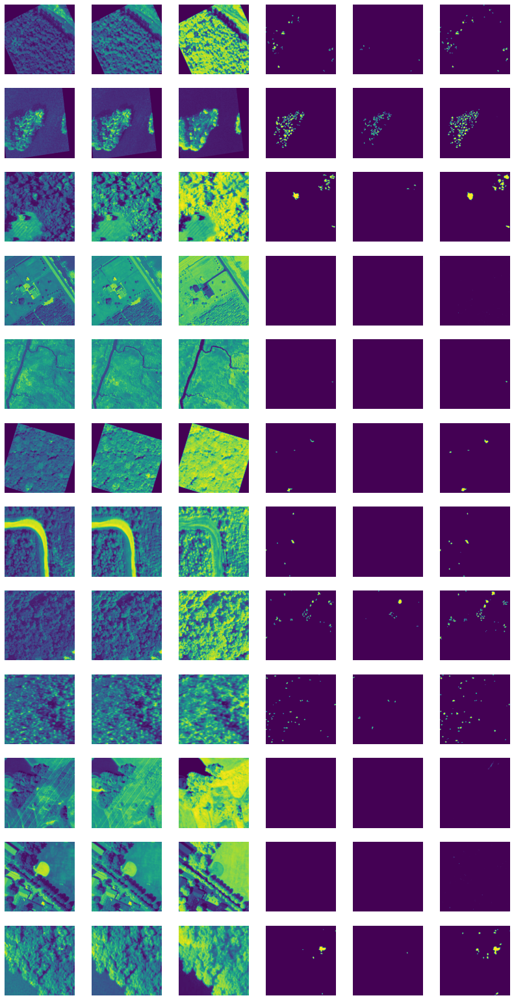

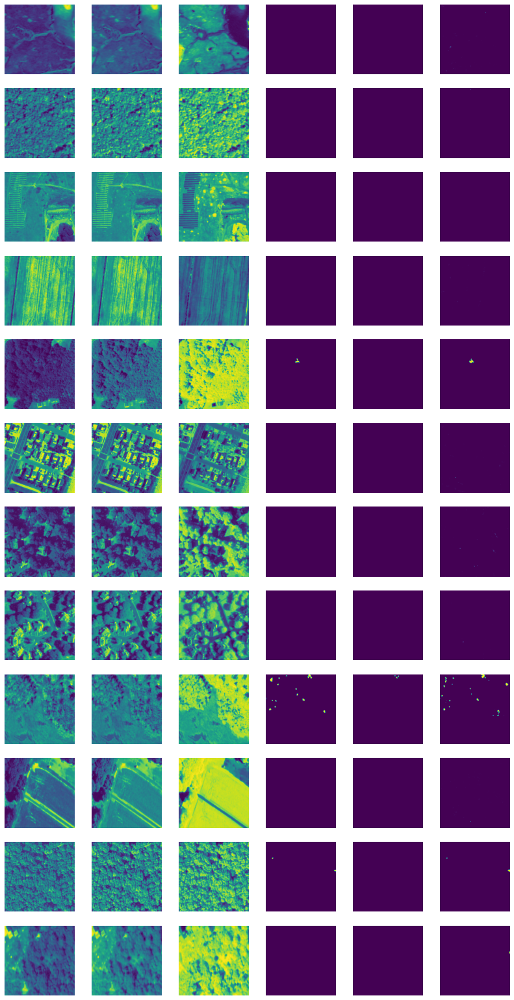

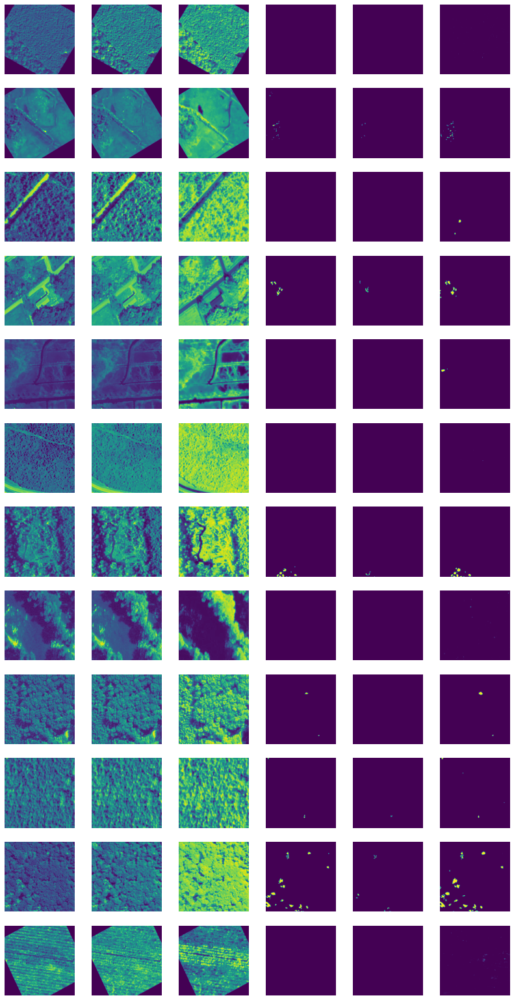

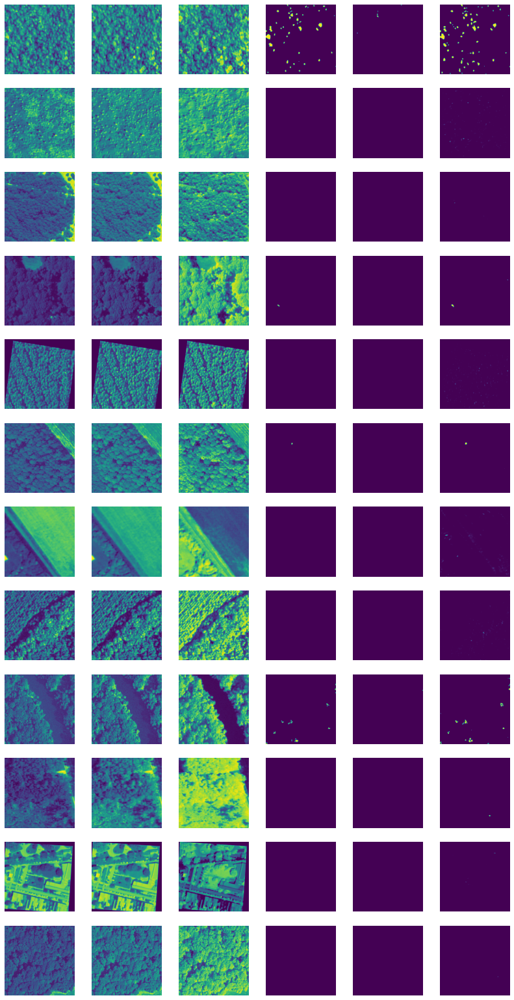

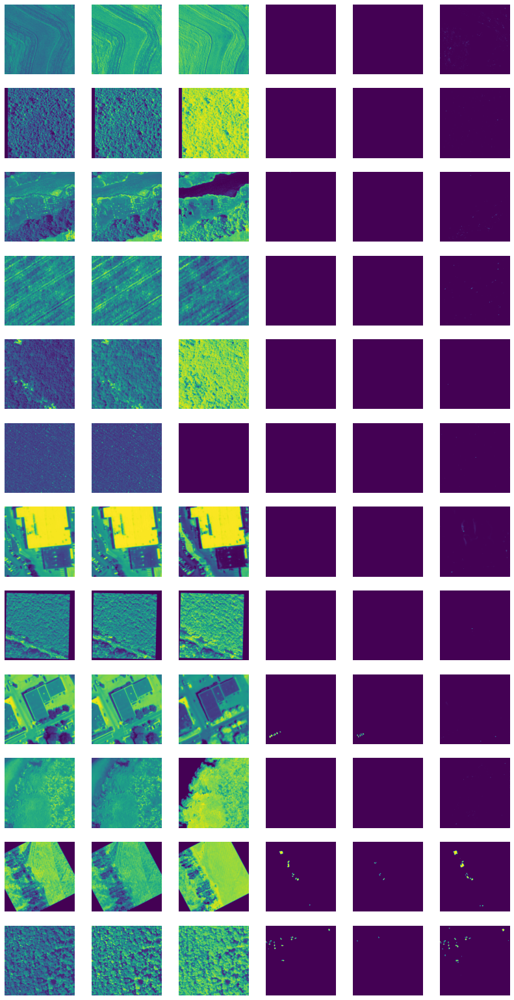

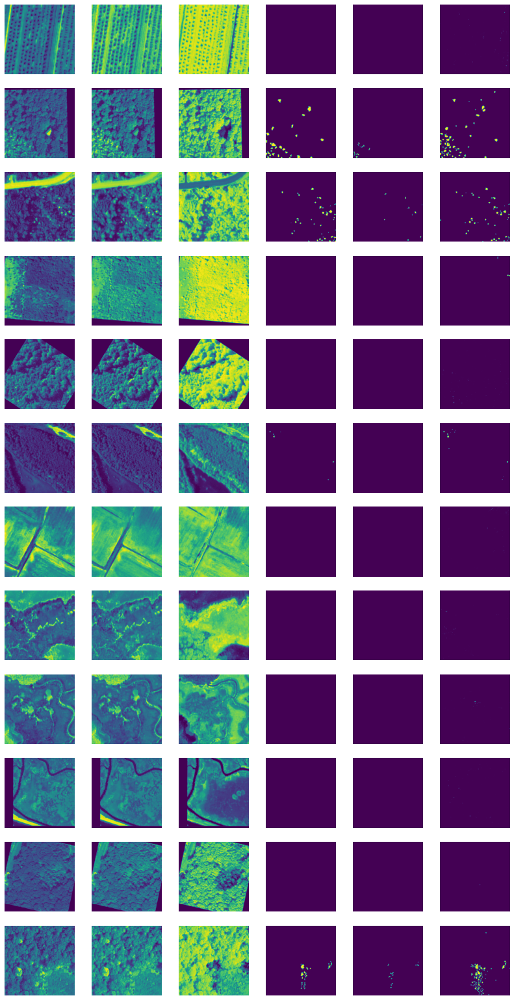

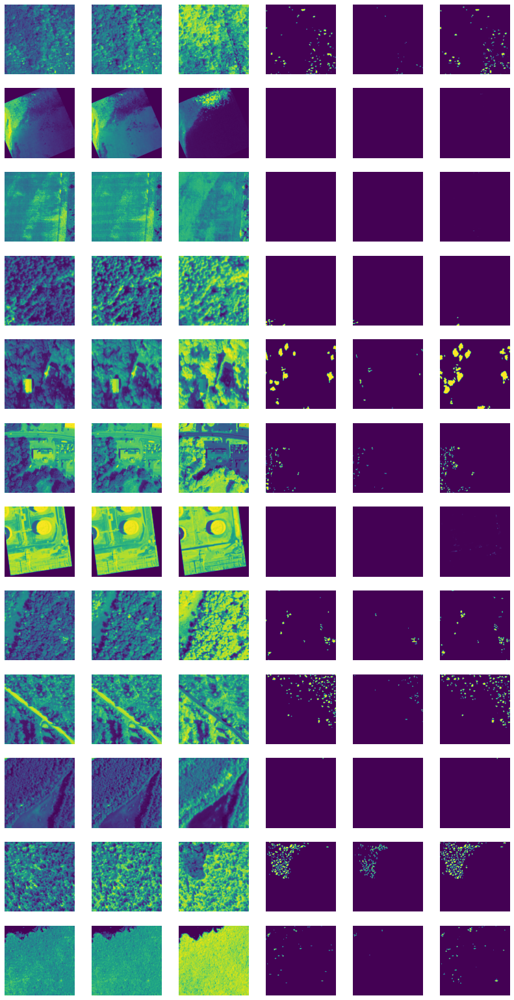

In [22]:
# # Print one batch on the training/test data!
# for i in range(10):
#     test_images, real_label = next(train_generator)
#     #5 images per row: pan, ndvi, label, weight, prediction
#     prediction = model.predict(test_images, steps=1)
# #     prediction[prediction>0.5]=1
# #     prediction[prediction<=0.5]=0
#     display_images(np.concatenate((test_images[...,[0,1,3]],real_label, prediction), axis = -1))